In [ ]:
#Always run this when a session is restarted
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
   raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))
print(tf.__version__)

Found GPU at: /device:GPU:0
1.15.2


In [ ]:
#Always run this when a session is restarted

from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd '/content/gdrive/My Drive/Object_detection/'

/content/gdrive/My Drive/Object_detection


In [ ]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 57544, done.
remote: Counting objects: 100% (1607/1607), done.
remote: Compressing objects: 100% (542/542), done.
remote: Total 57544 (delta 1106), reused 1500 (delta 1049), pack-reused 55937
Receiving objects: 100% (57544/57544), 572.97 MiB | 19.77 MiB/s, done.
Resolving deltas: 100% (39768/39768), done.
Checking out files: 100% (2470/2470), done.


In [ ]:
!apt-get update

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:8 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:9 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ Packages [60.9 kB]
Hit:10 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:11 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:13 http://ppa.launchpad.net/cran/

In [ ]:
!apt-get install protobuf-compiler python-pil python-lxml python-tk

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
python-tk is already the newest version (2.7.17-1~18.04).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  python-bs4 python-chardet python-html5lib python-olefile
  python-pkg-resources python-six python-webencodings
Suggested packages:
  python-genshi python-lxml-dbg python-lxml-doc python-pil-doc python-pil-dbg
  python-setuptools
The following NEW packages will be installed:
  python-bs4 python-chardet python-html5lib python-lxml python-olefile
  python-pil python-pkg-resources python-six python-webencodings
0 upgraded, 9 newly installed, 0 to remove and 86 not upgraded.
Need to get 1,614 kB of archives.
After this operation, 8,908 kB of additional disk space will be used.
Get:1 htt

In [ ]:
!pip install Cython

In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/

/content/gdrive/My Drive/Object_detection/models/research


In [ ]:
!protoc object_detection/protos/*.proto --python_out=.

In [ ]:
##Always run this when a session is restarted

import os
os.environ['PYTHONPATH'] += ':/content/gdrive/My Drive/Object_detection/models/research/:/content/gdrive/My Drive/Object_detection/models/research/slim'

In [ ]:
#if you wish to know the remaining hours you have for your colab session, run the copy and run the code below.

import time, psutil
Start = time.time()- psutil.boot_time()
Left= 12*3600 - Start
print('Time remaining for this session is: ', Left/3600)

Time remaining for this session is:  11.904826955265468


In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research
!python setup.py build
!python setup.py install

In [ ]:
#Always run this when a session is restarted

%cd /content/gdrive/My Drive/Object_detection/models/research
!python slim/setup.py build
!python slim/setup.py install

/content/gdrive/My Drive/Object_detection/models/research
running build
running build_py
running egg_info
writing slim.egg-info/PKG-INFO
writing dependency_links to slim.egg-info/dependency_links.txt
writing requirements to slim.egg-info/requires.txt
writing top-level names to slim.egg-info/top_level.txt
writing manifest file 'slim.egg-info/SOURCES.txt'
running install
running bdist_egg
running egg_info
writing slim.egg-info/PKG-INFO
writing dependency_links to slim.egg-info/dependency_links.txt
writing requirements to slim.egg-info/requires.txt
writing top-level names to slim.egg-info/top_level.txt
writing manifest file 'slim.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/adversarial_text
copying build/lib/adversarial_text/adversarial_losses.py -> build/bdist.linux-x86_64/egg/adversarial_text
copying build/lib/adversarial_text/gen_data.py -> b

In [ ]:
!pip install -q pycocotools

In [ ]:
!pip install -q Cython contextlib2 pillow lxml matplotlib PyDrive

In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/builders/
!python model_builder_test.py

/content/gdrive/My Drive/Object_detection/models/research/object_detection/builders


In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df
def main(directory_list):
    for Image_cat in directory_list:
        image_path = os.path.join(os.getcwd(), 'images/{}'.format(Image_cat))
        xml_df = xml_to_csv(image_path) 
        xml_df.to_csv('data/{}_labels.csv'.format(Image_cat), index=None)
        print('Successfully converted xml to csv.')
main(['train','test'])

/content/gdrive/My Drive/Object_detection/models/research/object_detection
Successfully converted xml to csv.
Successfully converted xml to csv.


In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/

/content/gdrive/My Drive/Object_detection/models/research


In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/
!python generate_tfrecord.py --label='Accident' --csv_input=data/train_labels.csv --output_path=data/train.record --img_path=images/train

/content/gdrive/My Drive/Object_detection/models/research/object_detection
Successfully created the TFRecords: /content/gdrive/My Drive/Object_detection/models/research/object_detection/data/train.record


In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/
!python generate_tfrecord.py --label='Accident' --csv_input=data/test_labels.csv --output_path=data/test.record --img_path=images/test

/content/gdrive/My Drive/Object_detection/models/research/object_detection
Successfully created the TFRecords: /content/gdrive/My Drive/Object_detection/models/research/object_detection/data/test.record


In [ ]:
!wget http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v1_coco_11_06_2017.tar.gz
!tar -xvf ssd_mobilenet_v1_coco_11_06_2017.tar.gz

--2021-05-29 06:05:17--  http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v1_coco_11_06_2017.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.141.128, 2607:f8b0:4023:c0b::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.141.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 128048406 (122M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v1_coco_11_06_2017.tar.gz’

ssd_mobilenet_v1_co 100%[===================>] 122.12M  78.0MB/s    in 1.6s    

2021-05-29 06:05:19 (78.0 MB/s) - ‘ssd_mobilenet_v1_coco_11_06_2017.tar.gz’ saved [128048406/128048406]

ssd_mobilenet_v1_coco_11_06_2017/
ssd_mobilenet_v1_coco_11_06_2017/model.ckpt.index
ssd_mobilenet_v1_coco_11_06_2017/model.ckpt.meta
ssd_mobilenet_v1_coco_11_06_2017/frozen_inference_graph.pb
ssd_mobilenet_v1_coco_11_06_2017/model.ckpt.data-00000-of-00001
ssd_mobilenet_v1_coco_11_06_2017/graph.pbtxt


In [ ]:
!wget https://github.com/tensorflow/models/blob/master/research/object_detection/samples/configs/ssd_mobilenet_v1_coco.config

--2021-05-29 06:05:30--  https://github.com/tensorflow/models/blob/master/research/object_detection/samples/configs/ssd_mobilenet_v1_coco.config
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘ssd_mobilenet_v1_coco.config’

ssd_mobilenet_v1_co     [ <=>                ] 163.08K   871KB/s    in 0.2s    

2021-05-29 06:05:30 (871 KB/s) - ‘ssd_mobilenet_v1_coco.config’ saved [166994]



In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/training
%load_ext tensorboard
%tensorboard --logdir=.

/content/gdrive/My Drive/Object_detection/models/research/object_detection/training


In [ ]:
!kill 9192

In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/training
%load_ext tensorboard
%tensorboard --logdir=.

In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/
!python train.py --logtostderr --train_dir=training/ --pipeline_config_path=training/ssd_mobilenet_v1_coco.config


In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/
!python train.py --logtostderr --train_dir=training/ --pipeline_config_path=training/ssd_mobilenet_v1_coco.config

Streaming output truncated to the last 5000 lines.
INFO:tensorflow:global step 67512: loss = 0.8012 (0.343 sec/step)
I0529 15:36:23.745691 139936186316672 learning.py:512] global step 67512: loss = 0.8012 (0.343 sec/step)
INFO:tensorflow:global step 67513: loss = 0.9035 (0.330 sec/step)
I0529 15:36:24.077471 139936186316672 learning.py:512] global step 67513: loss = 0.9035 (0.330 sec/step)
INFO:tensorflow:global step 67514: loss = 0.7334 (0.340 sec/step)
I0529 15:36:24.418837 139936186316672 learning.py:512] global step 67514: loss = 0.7334 (0.340 sec/step)
INFO:tensorflow:global step 67515: loss = 0.6598 (0.344 sec/step)
I0529 15:36:24.763939 139936186316672 learning.py:512] global step 67515: loss = 0.6598 (0.344 sec/step)
INFO:tensorflow:global step 67516: loss = 0.7644 (0.327 sec/step)
I0529 15:36:25.092559 139936186316672 learning.py:512] global step 67516: loss = 0.7644 (0.327 sec/step)
INFO:tensorflow:global step 67517: loss = 0.6268 (0.325 sec/step)
I0529 15:36:25.419193 139936

In [ ]:
!pip install lvis

In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/
!python model_main.py --logtostderr --train_dir=training/ --pipeline_config_path=training/ssd_mobilenet_v1_coco.config --checkpoint_dir=training/

/content/gdrive/My Drive/Object_detection/models/research/object_detection
W0604 11:35:14.948790 140703004354432 model_lib.py:812] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting train_steps: None
I0604 11:35:14.949013 140703004354432 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0604 11:35:14.949101 140703004354432 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: 1
I0604 11:35:14.949186 140703004354432 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: 1
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0604 11:35:14.949266 140703004354432 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0604 11:35:14.949367 140703004354432 model_lib.py:828] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Traceback (most recent call last):
  File "model_main.py", line 108, in <module>
    tf.app.run()
  File "/tensorflow-1.15.2/python3.7/tensorflow_core/python/platform/app.py", line 40, in run
    _run(main=main, argv=argv, flags_parser=_parse_flags_tolerate_undef)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 303, in run
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 251, in _run_main
    sys.exit(main(argv))
  File "model_main.py", line 93, in main
    train_steps, name, FLAGS.max_eval_retries)
  File "/content/gdrive/My Drive/Object_detection/models/research/object_detection/model_lib.py", line 1067, in continuous_eval
    estimator, model_dir, input_fn, train_steps, name, max_retries):
  File "/content/gdrive/My Drive/Object_detection/models/research/object_detection/model_lib.py", line 1022, in continuous_eval_generator
    timeout_fn=terminate_eval):
  File "/tensorflow-1.15.2/python3.7/tensorflow_core/python/training/checkpoint_utils.py", li

In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/
!python export_inference_graph.py --input_type image_tensor --pipeline_config_path training/ssd_mobilenet_v1_coco.config --trained_checkpoint_prefix training/model.ckpt-70000 --output_directory trained_inference_graph/

[Errno 2] No such file or directory: '/content/gdrive/My Drive/Desktop/models/research/object_detection/'
/content/gdrive/My Drive/Object_detection/models/research/object_detection
Instructions for updating:
Please use `layer.__call__` method instead.
W0529 16:02:03.996063 140628746618752 deprecation.py:323] From /usr/local/lib/python3.7/dist-packages/tf_slim-1.1.0-py3.7.egg/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0529 16:02:05.324910 140628746618752 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0529 16:02:05.360550 140628746618752 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of add

In [ ]:
pip uninstall tf_slim

In [ ]:
pip install tf_slim

     |████████████████████████████████| 358kB 4.9MB/s 


/content/gdrive/My Drive/Object_detection/models/research/object_detection


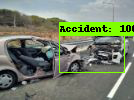

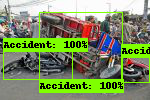

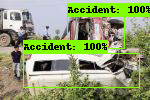

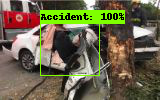

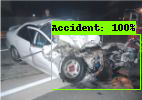

...

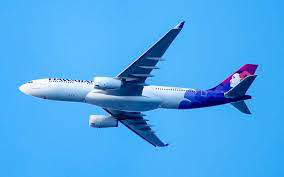

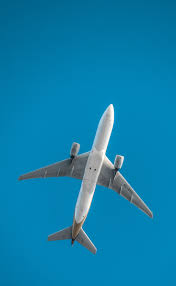

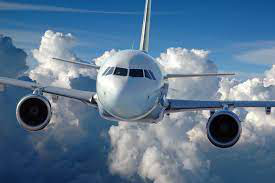

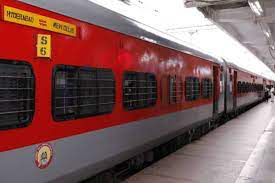

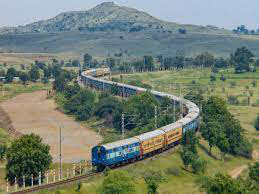

In [ ]:
%cd /content/gdrive/My Drive/Object_detection/models/research/object_detection/
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from distutils.version import StrictVersion
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util



### Model preparation variable
MODEL_NAME = 'trained_inference_graph'
PATH_TO_FROZEN_GRAPH = MODEL_NAME + '/frozen_inference_graph.pb'
PATH_TO_LABELS = 'training/object-detection.pbtxt'
NUM_CLASSES = 1 #remember number of objects you are training? cool.


### Load a (frozen) Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')


###Loading label map
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)




### Load image into numpy function
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)




###STATING THE PATH TO IMAGES TO BE TESTED
PATH_TO_TEST_IMAGES_DIR = 'images/testing_images'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.jpg'.format(i)) for i in range(1, 37) ]
IMAGE_SIZE = (12, 8)




### Function to run inference on a single image which will later be used in an iteration
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[1], image.shape[2])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: image})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.int64)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict



### To iterate on each image in the test image path defined 
### NB define the range of numbers and let it match the number of imAGES IN TEST FOLDER +1
for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np_expanded, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=1)
  display(Image.fromarray(image_np))